In [4]:
# ✅ 필수 라이브러리 설치
!pip install -q ultralytics insightface onnxruntime torch torchvision tqdm albumentations numpy opencv-python matplotlib

import os
import torch
import torch.nn as nn
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from insightface.app import FaceAnalysis
from ultralytics import YOLO


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.5/439.5 kB 13.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 31.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 70.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 4.8 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
# ✅ 디바이스 설정 (GPU 사용 가능 여부 확인)
device = "cuda" if torch.cuda.is_available() else "cpu"

# ✅ 1. 그룹 및 멤버 이름 매핑 (ID → 이름 변환)
GROUPS = ["EXO", "IVE", "NJZ", "RED", "SK", "UNKNOWN"]  # Unknown 추가
MEMBERS = {
    "EXO": ["D.O", "Kai"],
    "IVE": ["An Yujin", "Jang Wonyoung"],
    "NJZ": ["Danielle", "Gang Harin", "Kim Minji", "Pham Hanni"],
    "RED": ["Irene", "Joy", "Seulgi", "Wendy"],
    "SK": ["Hyunjin", "Felix"],
    "UNKNOWN": ["Unknown"]  # Unknown 멤버 추가
}



In [6]:
# ✅ 2. 학습된 모델 로드
MODEL_SAVE_PATH = "/kaggle/input/savesvave/2best_hierarchical_arcface(b).pth"

class HierarchicalArcFaceModel(nn.Module):
    def __init__(self, embedding_size=512, num_groups=len(GROUPS), num_members=[len(members) for members in MEMBERS.values()]):
        super(HierarchicalArcFaceModel, self).__init__()
        self.global_fc = nn.Sequential(
            nn.Linear(embedding_size, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.2),
        )
        self.group_head = nn.Linear(512, num_groups)  # 그룹 분류 헤드
        self.member_heads = nn.ModuleList(
            [nn.Linear(512, num_members[i]) for i in range(num_groups)]
        )

    def forward(self, x):
        features = self.global_fc(x)
        group_logits = self.group_head(features)  # 그룹 예측
        predicted_group = torch.argmax(group_logits, dim=1)  # 예측된 그룹

        batch_size = features.shape[0]
        member_logits_padded = torch.zeros(batch_size, max([h.out_features for h in self.member_heads])).to(features.device)

        for i in range(batch_size):
            group_idx = predicted_group[i].item()
            member_logits = self.member_heads[group_idx](features[i].unsqueeze(0))
            member_logits_padded[i, :member_logits.shape[1]] = member_logits

        return group_logits, member_logits_padded

In [7]:
# ✅ 모델 로드
model = HierarchicalArcFaceModel().to(device)
model.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location=device))
model.eval()

HierarchicalArcFaceModel(
  (global_fc): Sequential(
    (0): Linear(in_features=512, out_features=512, bias=True)
    (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.2, inplace=False)
  )
  (group_head): Linear(in_features=512, out_features=6, bias=True)
  (member_heads): ModuleList(
    (0-1): 2 x Linear(in_features=512, out_features=2, bias=True)
    (2-3): 2 x Linear(in_features=512, out_features=4, bias=True)
    (4): Linear(in_features=512, out_features=2, bias=True)
    (5): Linear(in_features=512, out_features=1, bias=True)
  )
)

In [8]:
# ✅ 3. YOLOv8 모델 로드
yolo_model_path = "/kaggle/input/realv8/yolov8s.pt"
yolo_model = YOLO(yolo_model_path).to(device)

In [9]:
# ✅ 4. ArcFace 기반 얼굴 탐지 모델 로드
app = FaceAnalysis(name="buffalo_l", providers=["CUDAExecutionProvider", "CPUExecutionProvider"])
app.prepare(ctx_id=0 if device == "cuda" else -1)

download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:03<00:00, 78511.29KB/s]
/usr/local/lib/python3.10/dist-packages/onnxruntime/capi/onnxruntime_inference_collection.py:118: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


In [10]:
# ✅ 5. 테스트할 이미지 경로 설정
test_images_dir = "/kaggle/input/test-set-images"
test_image_paths = glob.glob(os.path.join(test_images_dir, "*"))

In [11]:
# ✅ 6. 안전한 이미지 로드 함수
def load_image(image_path):
    try:
        img = Image.open(image_path).convert("RGB")
        img = np.array(img)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        return img
    except Exception as e:
        print(f"⚠️ ERROR: {e} (이미지 로드 실패: {image_path})")
        return None

In [12]:
def detect_and_classify(image_path, method="yolo"):
    img = load_image(image_path)
    if img is None:
        print(f"⚠️ 이미지를 불러올 수 없습니다. 건너뜁니다: {image_path}")
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # ✅ 감지된 얼굴 저장할 리스트 초기화
    detections = []

    if method == "yolo":
        results = yolo_model(img_rgb)
        for result in results:
            for box in result.boxes.xyxy.cpu().numpy():
                x1, y1, x2, y2 = map(int, box)
                face_crop = img_rgb[y1:y2, x1:x2]
                faces = app.get(face_crop)
                if faces:
                    embedding = faces[0].embedding
                    detections.append((x1, y1, x2, y2, embedding))

    elif method == "arcface":
        faces = app.get(img_rgb)
        h, w, _ = img.shape

        for face in faces:
            bbox = face.bbox.astype(int)
            x1, y1, x2, y2 = bbox

            # ✅ 탐지 영역을 기존보다 1.5배 확장
            x1 = max(0, round(x1 - (x2 - x1) * 0.25))
            y1 = max(0, round(y1 - (y2 - y1) * 0.25))
            x2 = min(w, round(x2 + (x2 - x1) * 0.25))
            y2 = min(h, round(y2 + (y2 - y1) * 0.25))

            embedding = face.embedding
            detections.append((x1, y1, x2, y2, embedding))

    # ✅ 얼굴이 감지되지 않은 경우 Unknown 처리
    if not detections:
        print(f"❌ 얼굴을 찾을 수 없습니다: {image_path} → Unknown 처리")
        return  # 빈 리스트라면 여기서 종료 (오류 방지)

    predictions = []
    for (x1, y1, x2, y2, embedding) in detections:
        embedding_tensor = torch.tensor(embedding, dtype=torch.float32).unsqueeze(0).to(device)

        # ✅ 모델을 통해 group_logits, member_logits 얻기
        with torch.no_grad():
            group_logits, member_logits = model(embedding_tensor)

        # ✅ 확률 값 계산 (Softmax 적용)
        group_probs = torch.softmax(group_logits, dim=1)
        member_probs = torch.softmax(member_logits, dim=1)

        predicted_group_id = torch.argmax(group_probs, dim=1).item()
        group_confidence = group_probs[0, predicted_group_id].item()

        # ✅ Unknown 판단 로직 추가
        if predicted_group_id >= len(GROUPS) or group_confidence < 0.5:
            predicted_group_name = "UNKNOWN"
            predicted_member_name = "Unknown"
            member_confidence = group_confidence  # Unknown의 신뢰도를 그룹 신뢰도로 설정
        else:
            predicted_group_name = GROUPS[predicted_group_id]
            predicted_member_id = torch.argmax(member_probs, dim=1).item()
            member_confidence = member_probs[0, predicted_member_id].item()

            if predicted_group_name in MEMBERS:
                predicted_member_name = MEMBERS[predicted_group_name][predicted_member_id]
            else:
                predicted_member_name = "Unknown"

        predictions.append({
            "bbox": (x1, y1, x2, y2),
            "group": predicted_group_name,
            "member": predicted_member_name,
            "confidence": member_confidence
        })

    # ✅ 같은 사람이 여러 명 감지된 경우, 확률이 가장 높은 사람만 선택
    unique_predictions = {}
    for pred in predictions:
        key = (pred["group"], pred["member"])
        if key not in unique_predictions or pred["confidence"] > unique_predictions[key]["confidence"]:
            unique_predictions[key] = pred

    # ✅ 최종 출력
    for pred in unique_predictions.values():
        x1, y1, x2, y2 = pred["bbox"]
        confidence = pred["confidence"]
        label_str = f"{pred['group']} - {pred['member']} ({confidence:.2f})"

        # ✅ 0.5 미만이면 빨간색, ✅ 0.5 이상이면 초록색 박스
        box_color = (0, 0, 255) if confidence < 0.5 else (0, 255, 0)

        cv2.rectangle(img, (x1, y1), (x2, y2), box_color, 2)
        cv2.putText(img, label_str, (x1, max(y1 - 10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_color, 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Detection Result: {os.path.basename(image_path)}")
    plt.axis("off")
    plt.show()



0: 384x640 7 persons, 1 chair, 334.6ms
Speed: 8.2ms preprocess, 334.6ms inference, 30.2ms postprocess per image at shape (1, 3, 384, 640)


/usr/local/lib/python3.10/dist-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


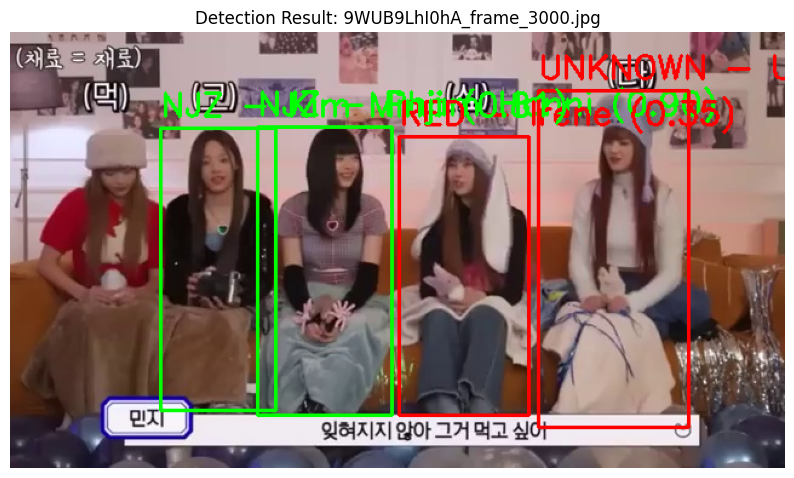

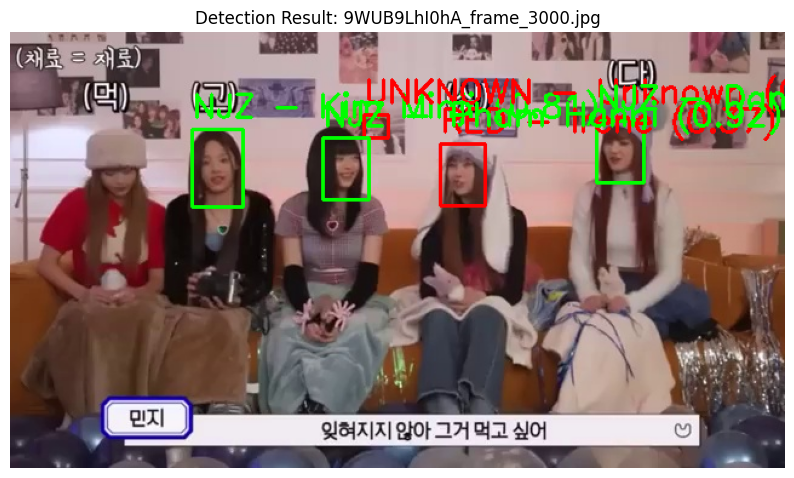


0: 416x640 1 person, 231.0ms
Speed: 3.1ms preprocess, 231.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


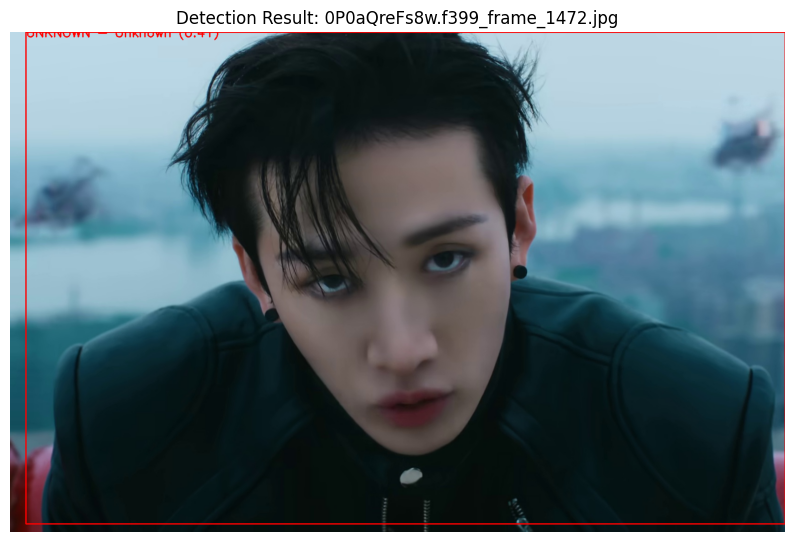

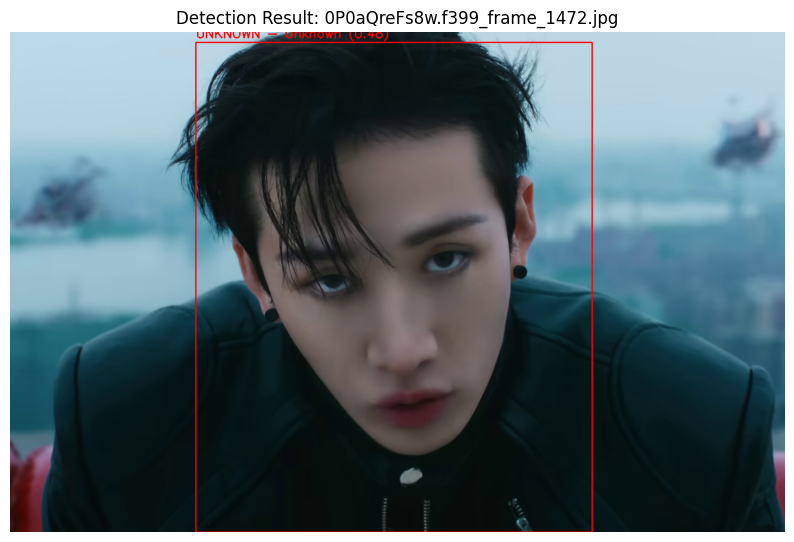


0: 384x640 5 persons, 207.8ms
Speed: 2.8ms preprocess, 207.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


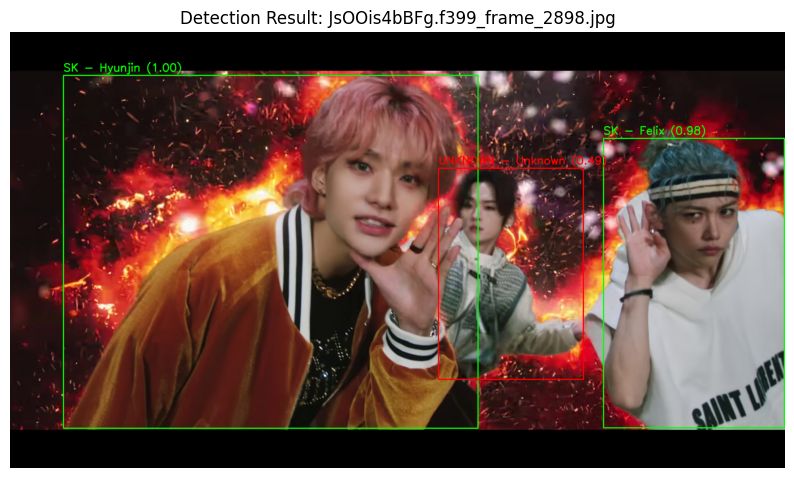

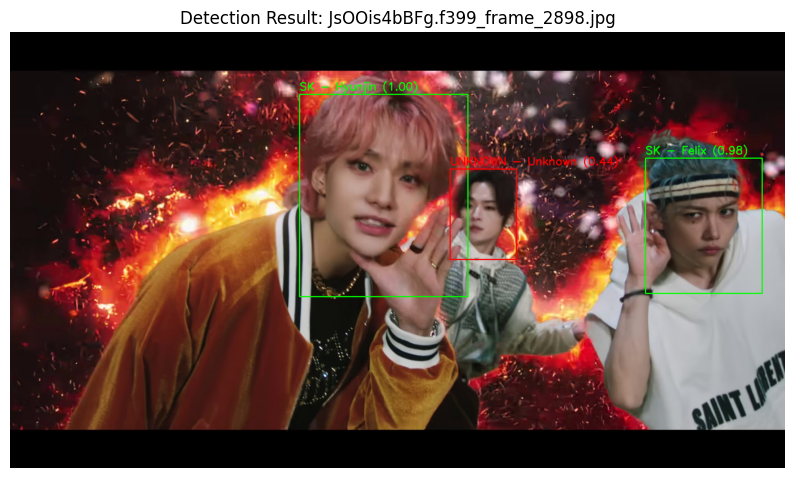


0: 384x640 2 persons, 1 toothbrush, 203.6ms
Speed: 1.8ms preprocess, 203.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


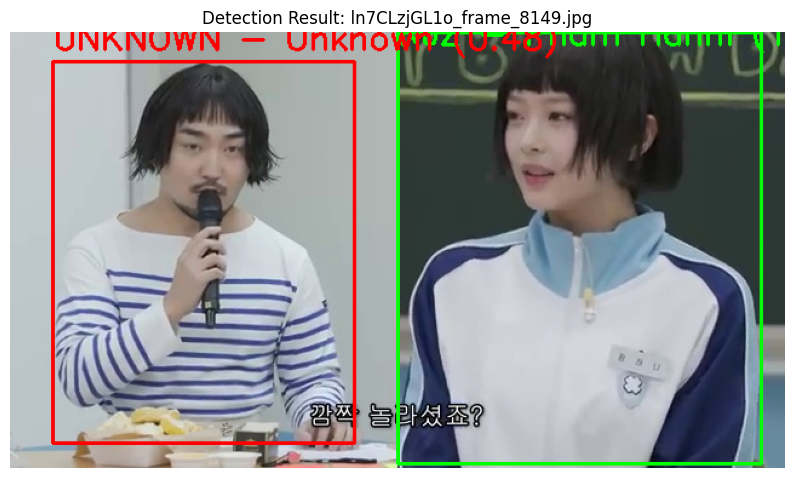

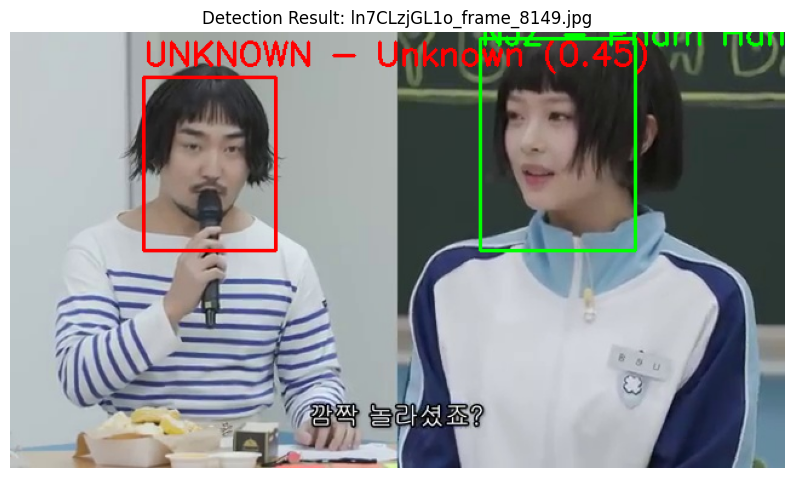


0: 384x640 5 persons, 2 benchs, 200.9ms
Speed: 2.6ms preprocess, 200.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


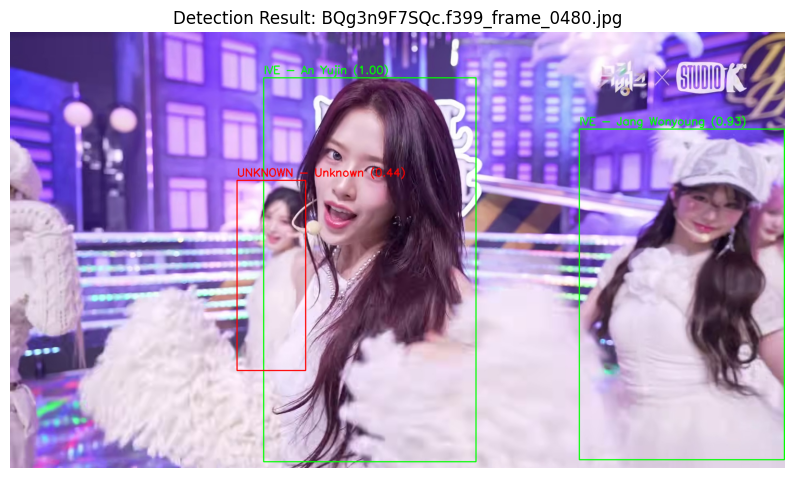

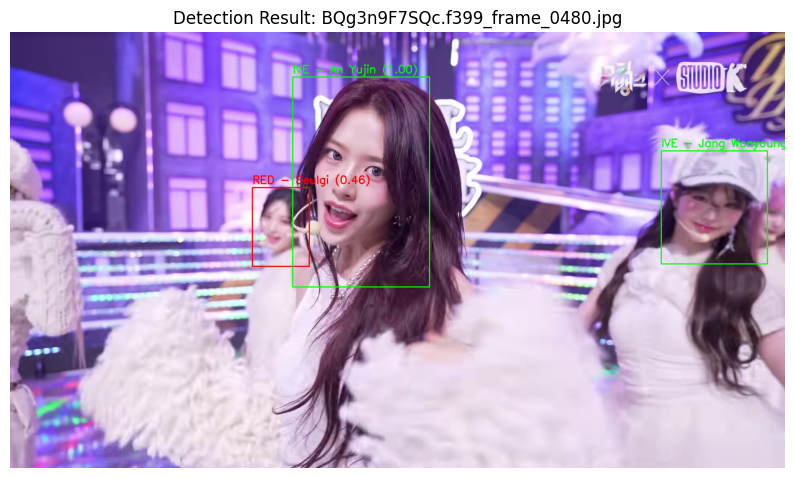


0: 448x640 3 persons, 1 snowboard, 305.5ms
Speed: 3.0ms preprocess, 305.5ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


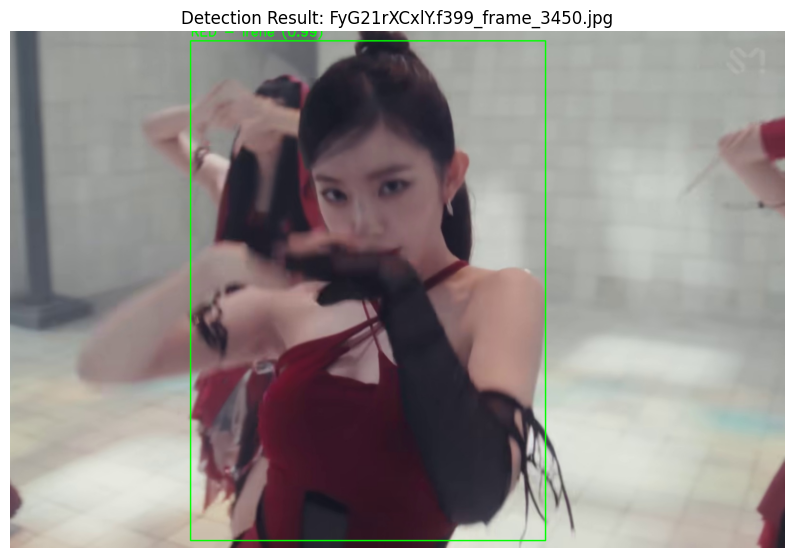

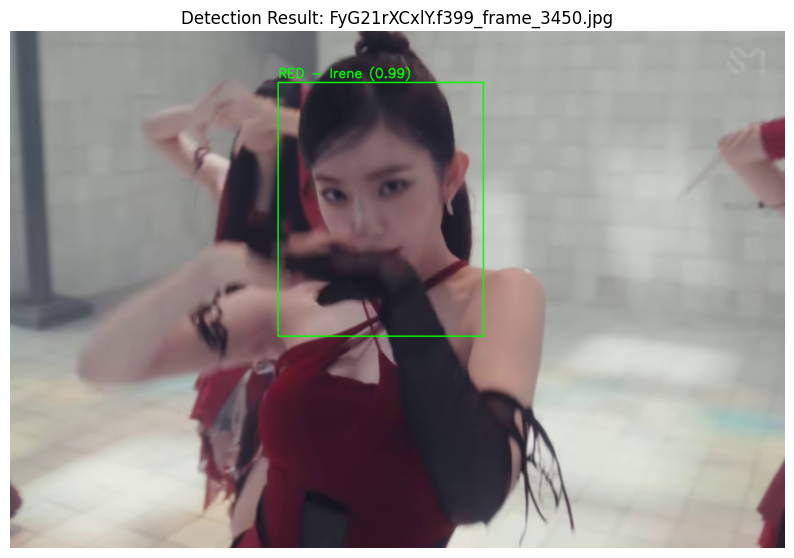


0: 384x640 2 persons, 1 tie, 208.9ms
Speed: 2.3ms preprocess, 208.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


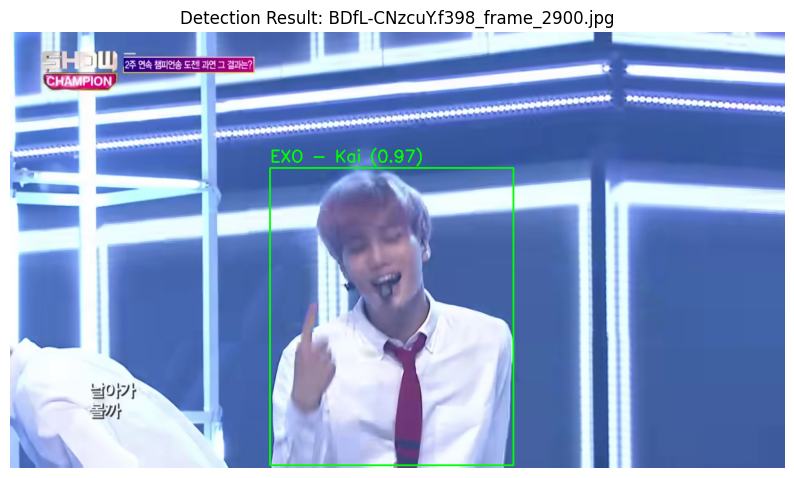

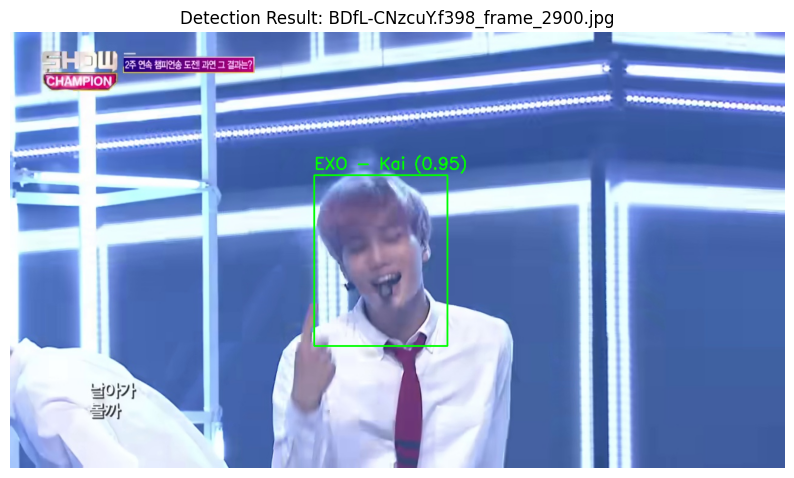


0: 448x640 1 person, 230.4ms
Speed: 3.7ms preprocess, 230.4ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


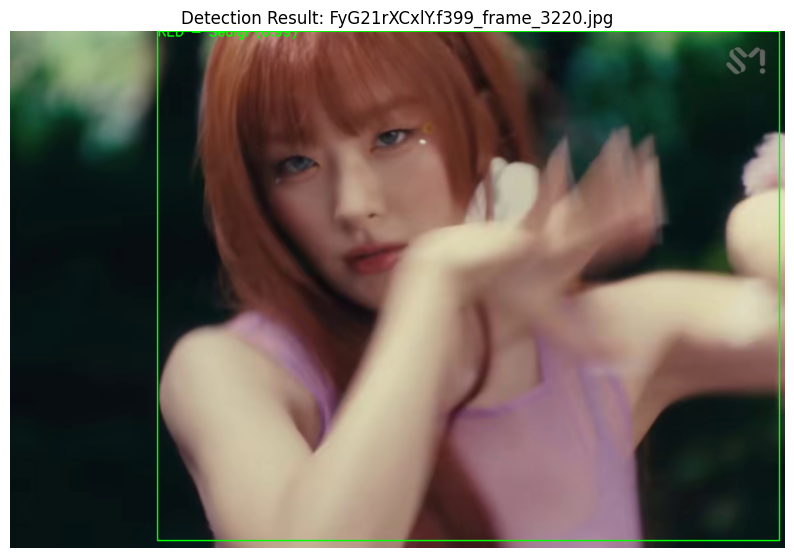

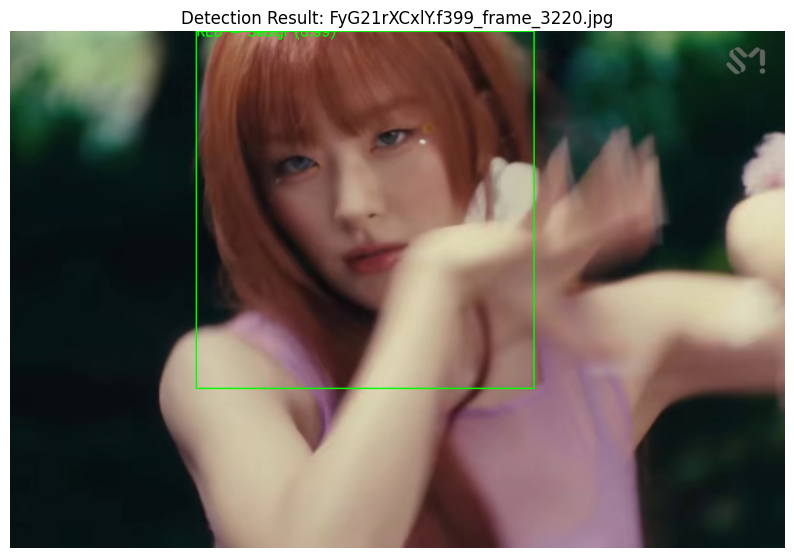


0: 384x640 6 persons, 2 ties, 1 sink, 200.1ms
Speed: 2.7ms preprocess, 200.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


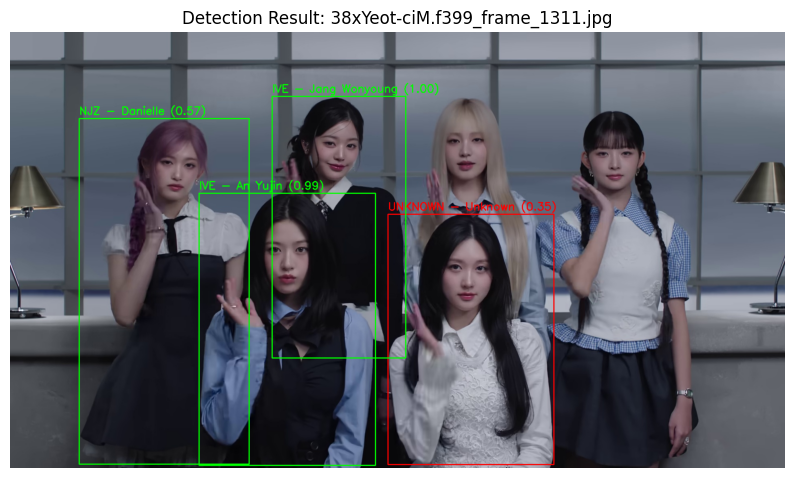

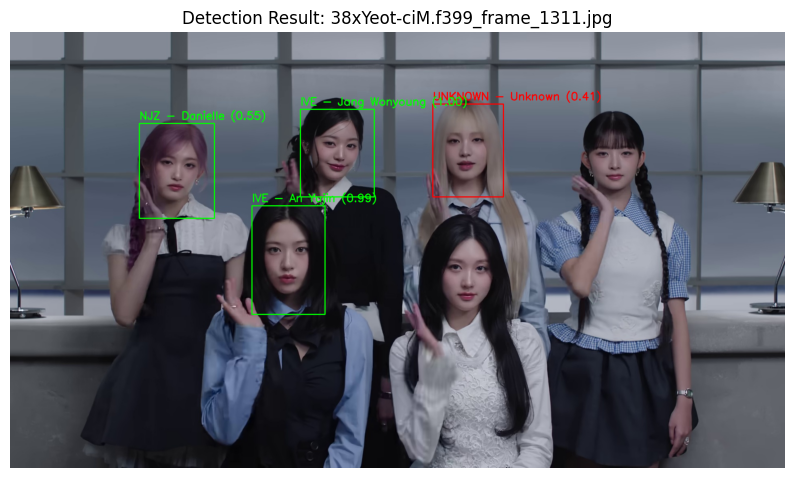


0: 384x640 6 persons, 1 wine glass, 1 chair, 201.2ms
Speed: 1.8ms preprocess, 201.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


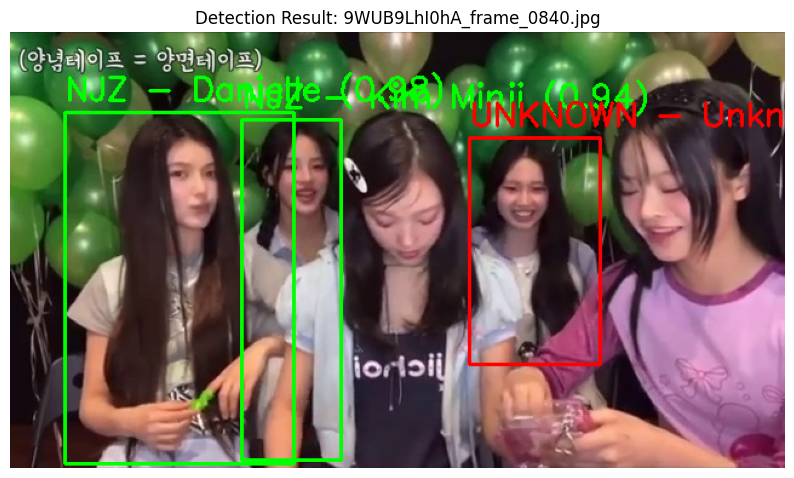

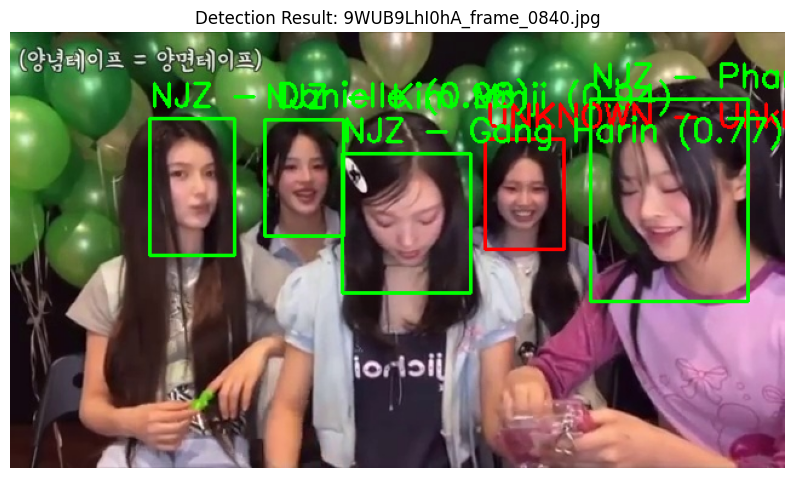


0: 448x640 1 person, 229.1ms
Speed: 3.0ms preprocess, 229.1ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


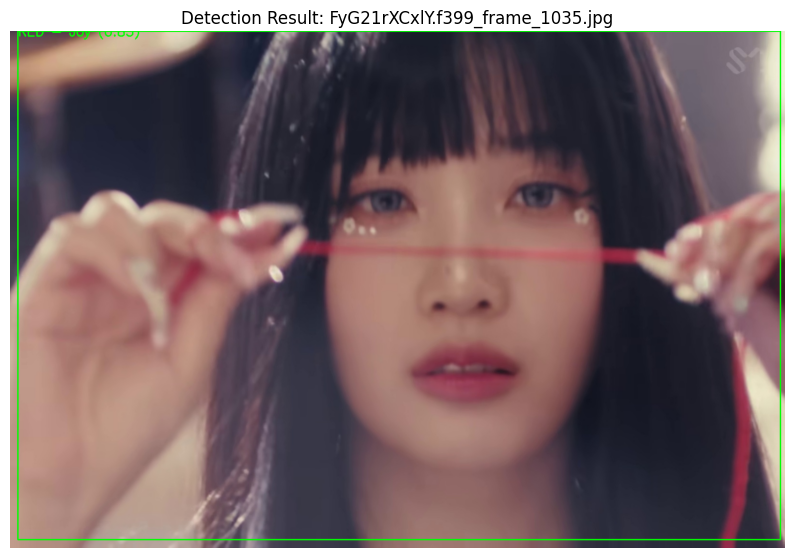

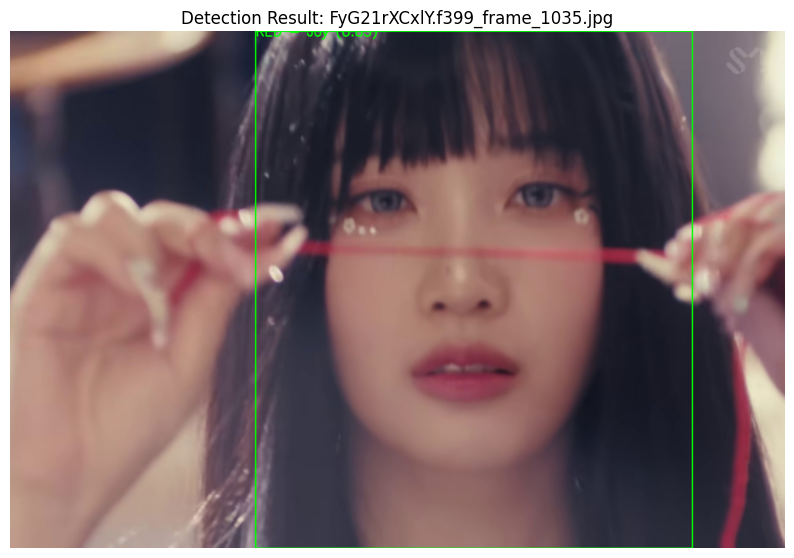


0: 448x640 2 persons, 1 tie, 238.3ms
Speed: 3.2ms preprocess, 238.3ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


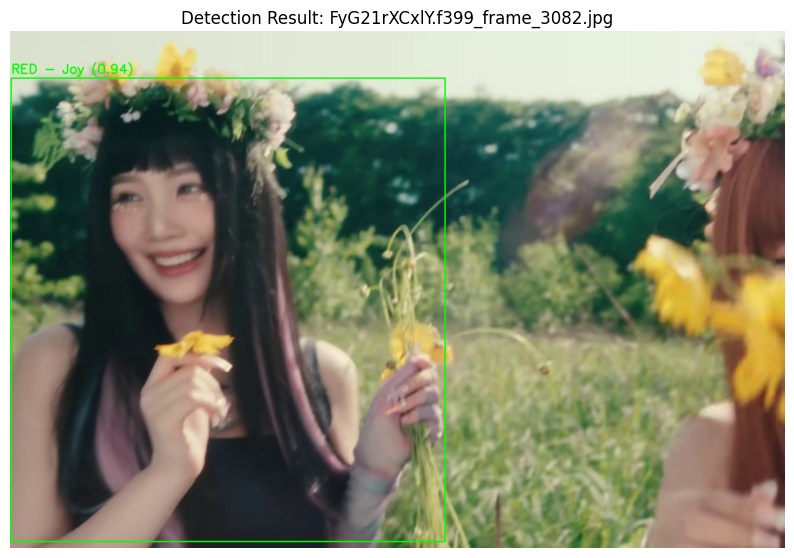

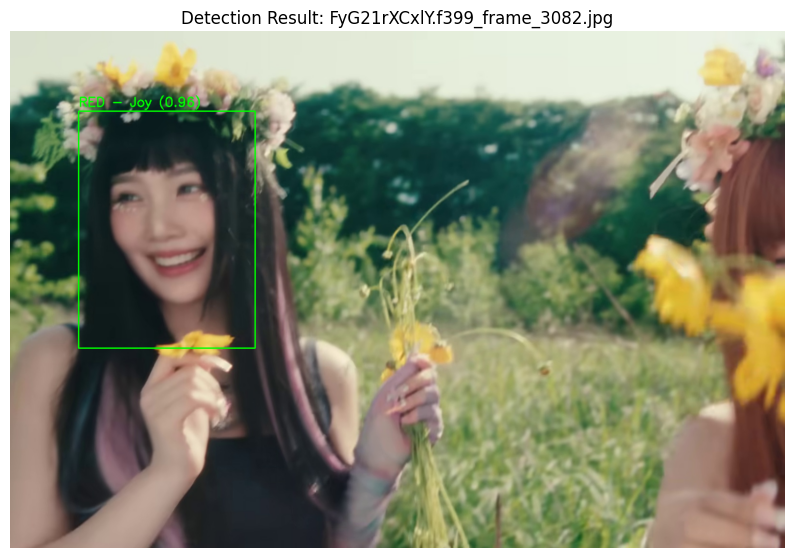


0: 384x640 2 persons, 1 suitcase, 2 surfboards, 1 chair, 271.5ms
Speed: 2.8ms preprocess, 271.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


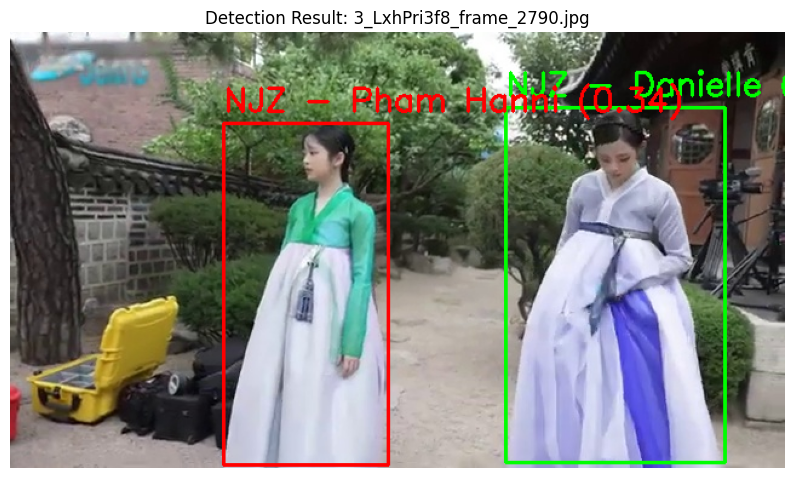

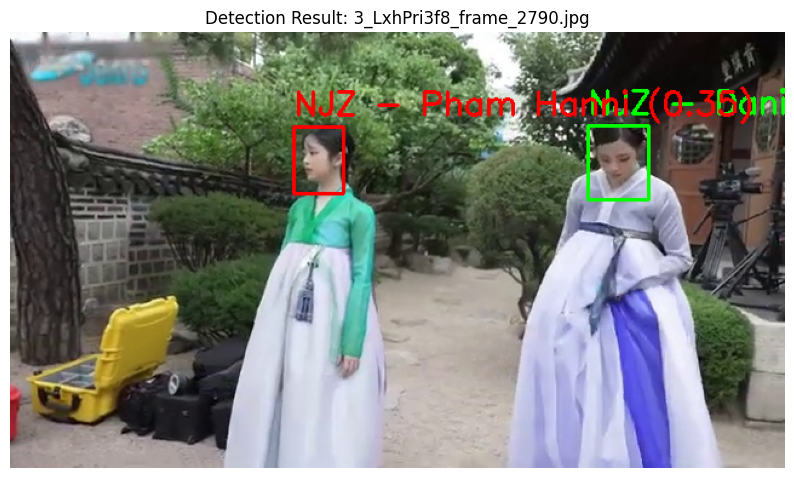


0: 320x640 2 persons, 201.7ms
Speed: 3.0ms preprocess, 201.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 640)


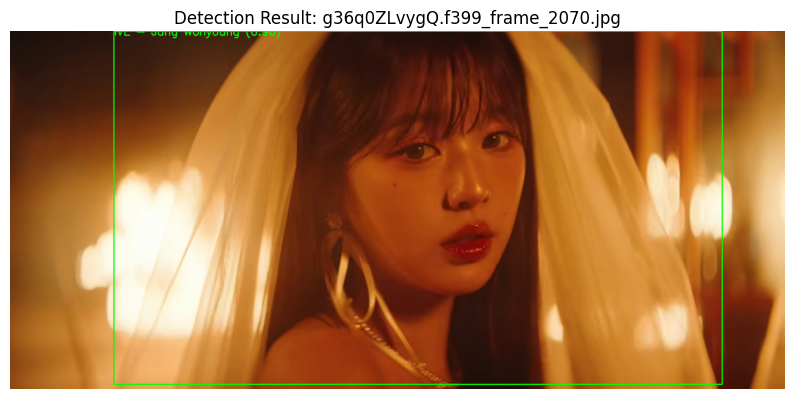

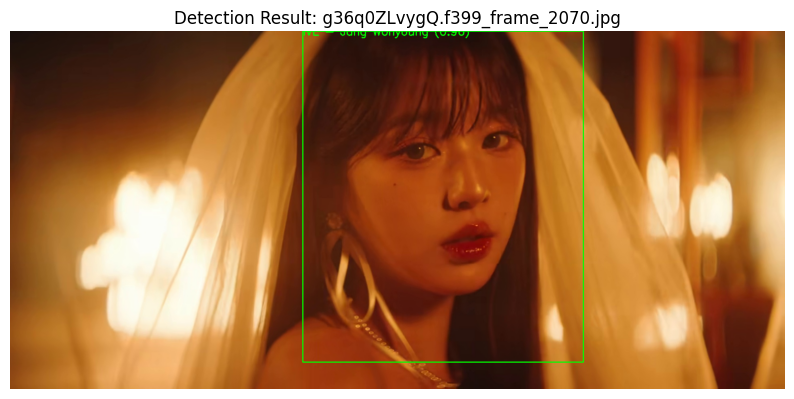


0: 416x640 3 persons, 226.7ms
Speed: 2.9ms preprocess, 226.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


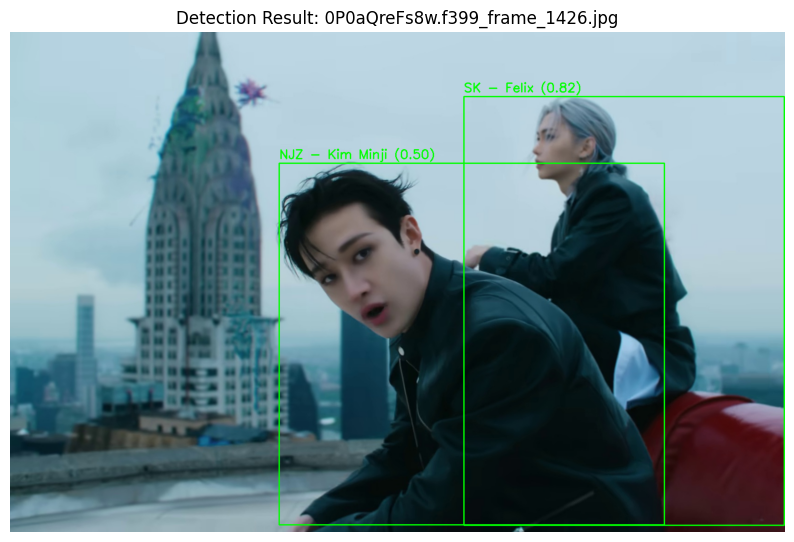

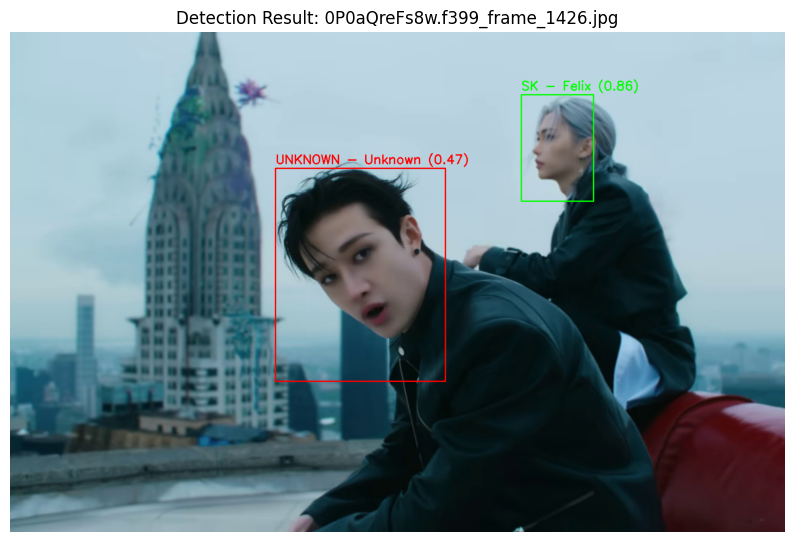


0: 448x640 1 person, 238.7ms
Speed: 3.6ms preprocess, 238.7ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


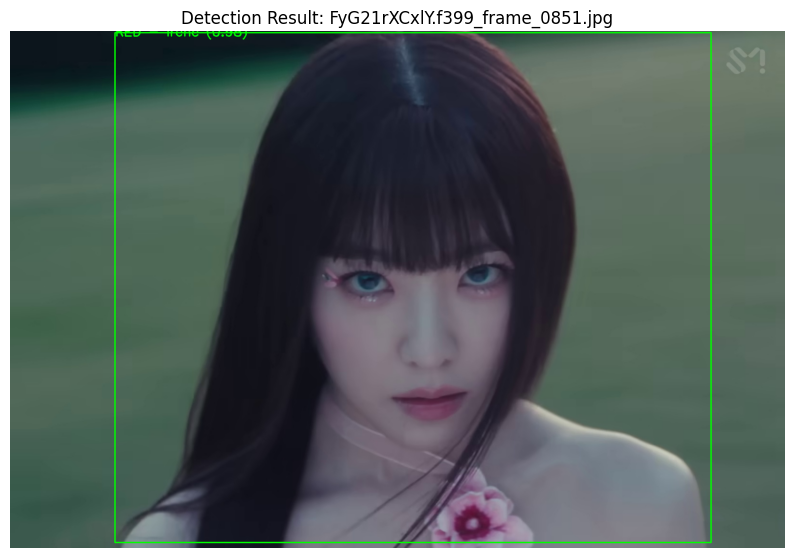

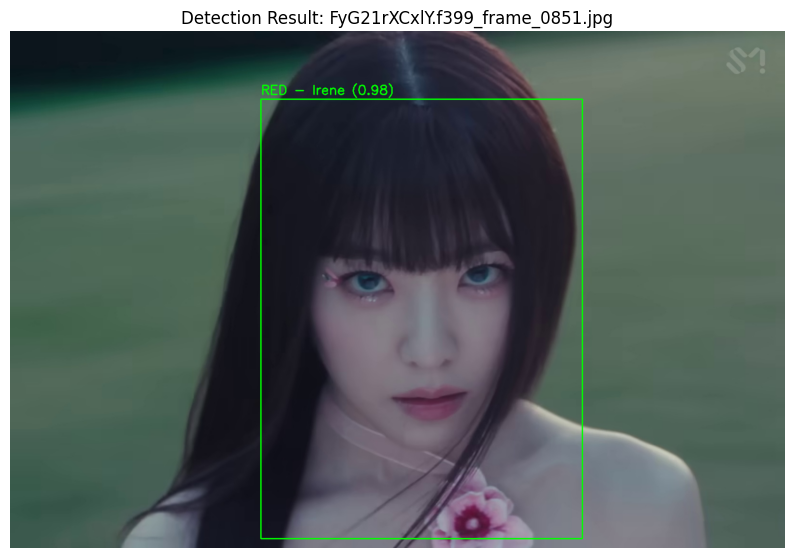


0: 416x640 1 person, 1 remote, 1 cell phone, 219.5ms
Speed: 2.8ms preprocess, 219.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


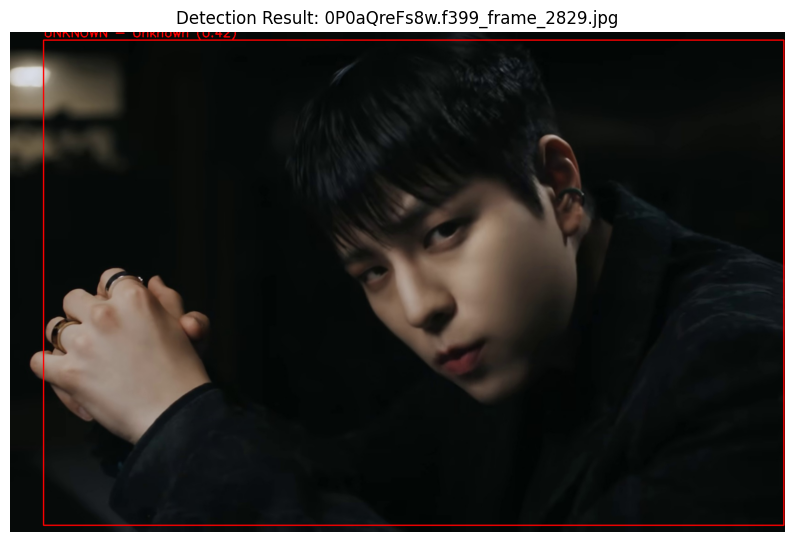

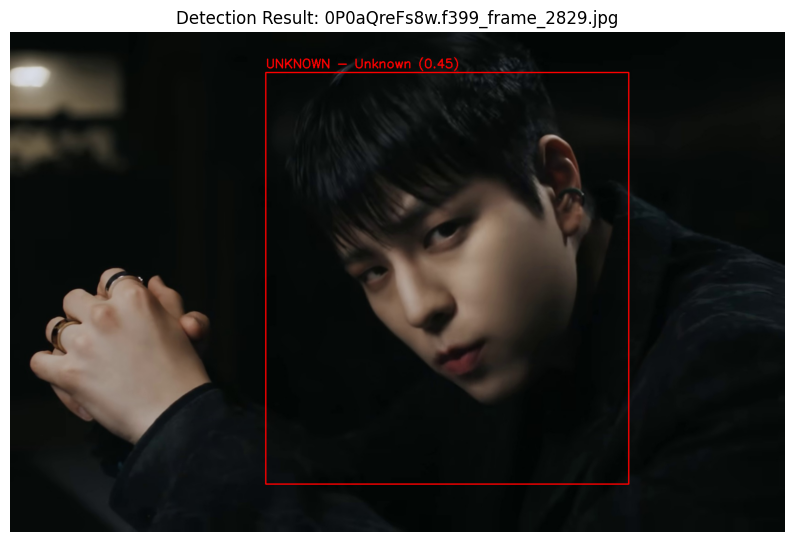


0: 416x640 3 persons, 233.0ms
Speed: 3.0ms preprocess, 233.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


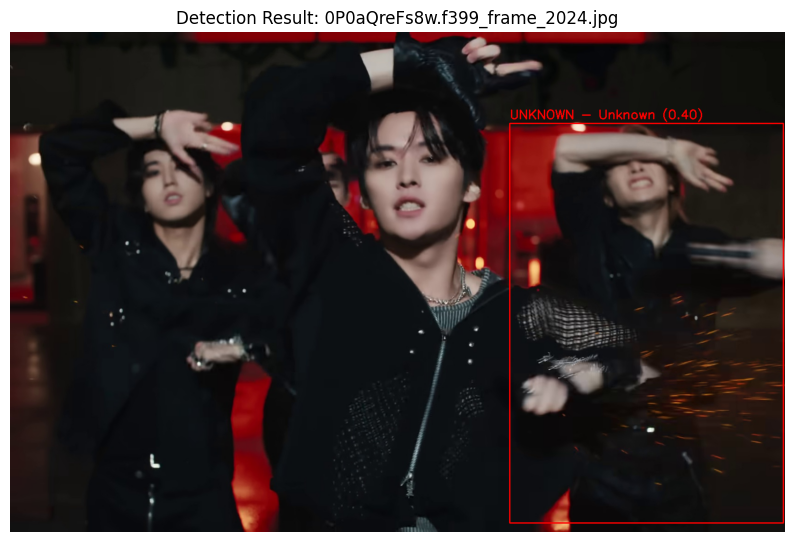

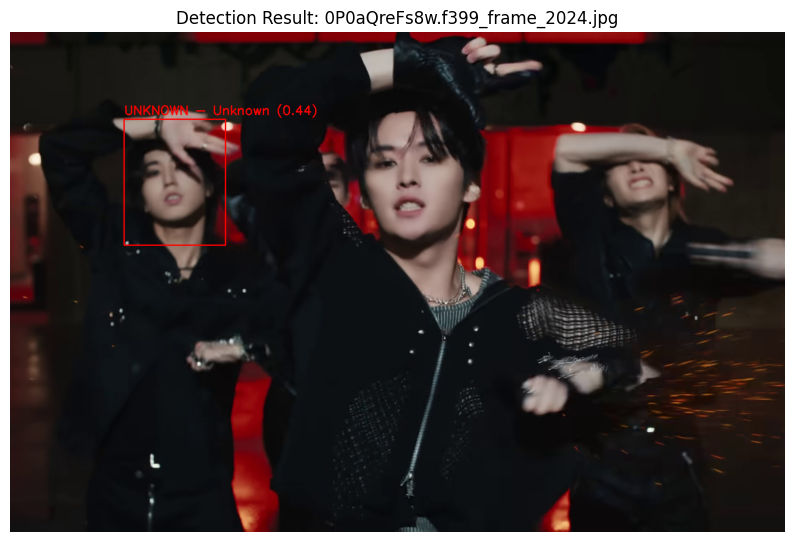


0: 416x640 1 person, 218.3ms
Speed: 2.9ms preprocess, 218.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


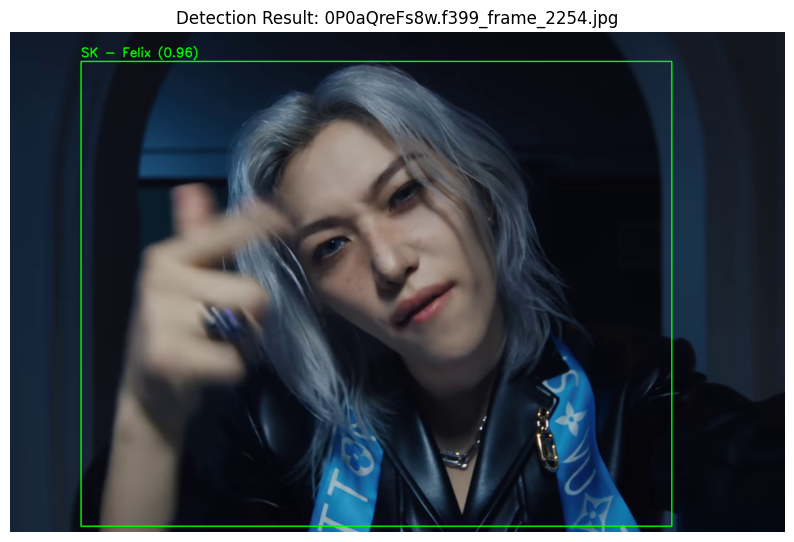

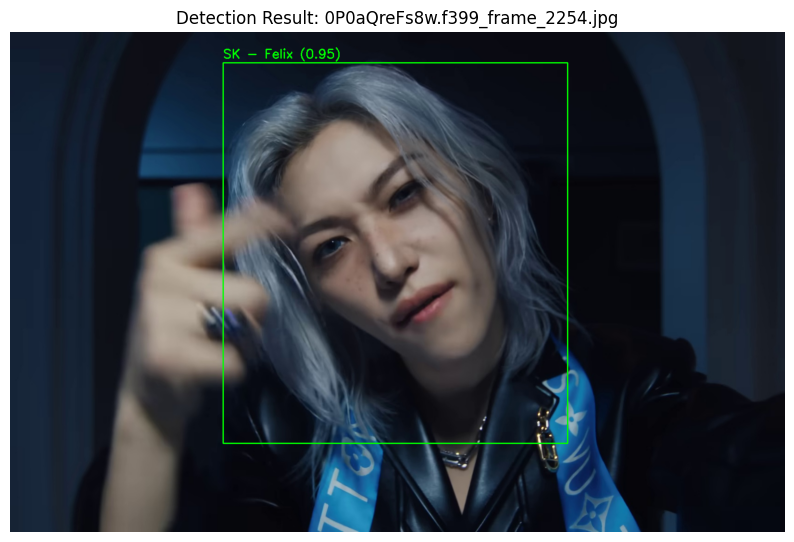


0: 384x640 1 person, 2 ties, 208.0ms
Speed: 2.7ms preprocess, 208.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


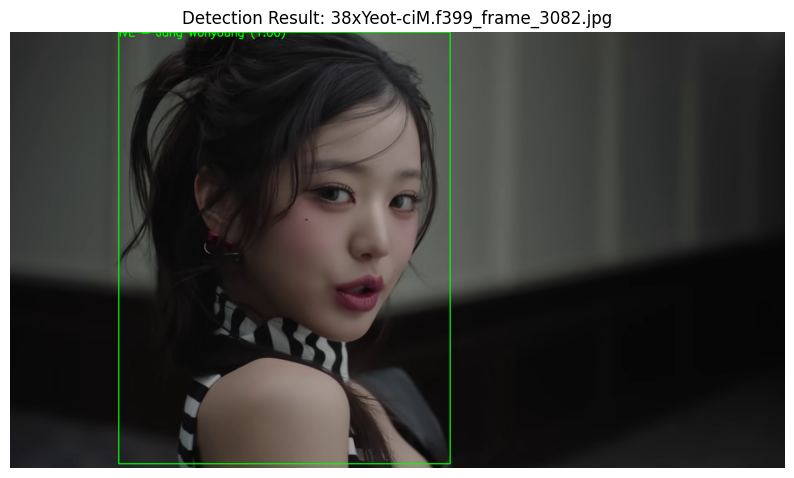

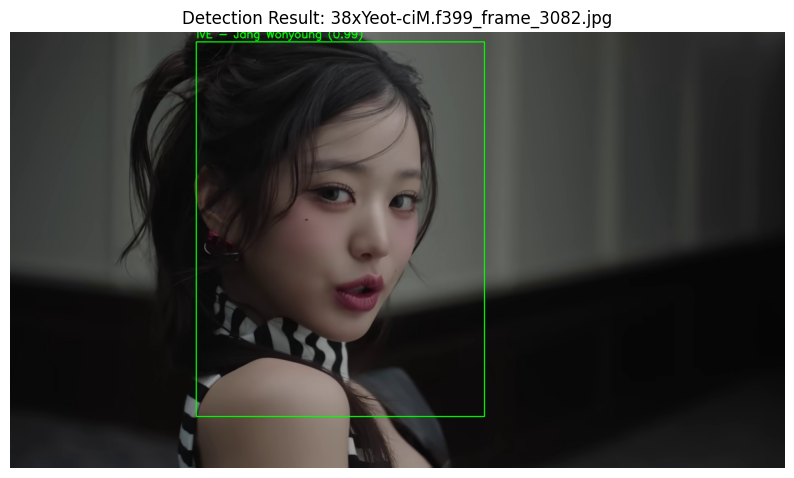


0: 384x640 4 persons, 203.9ms
Speed: 2.7ms preprocess, 203.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


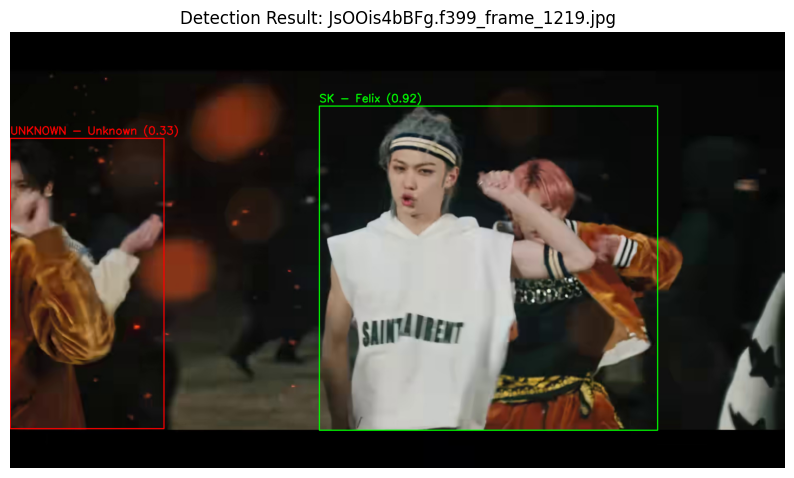

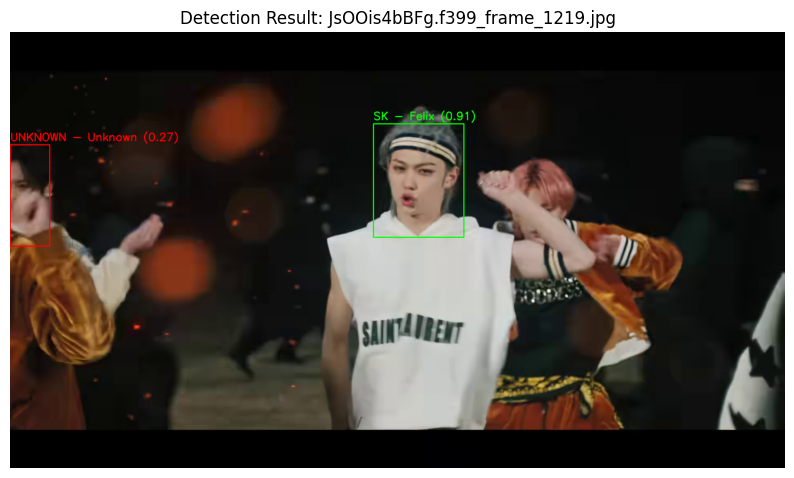


0: 416x640 3 persons, 1 tie, 1 bottle, 1 cell phone, 210.0ms
Speed: 3.2ms preprocess, 210.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


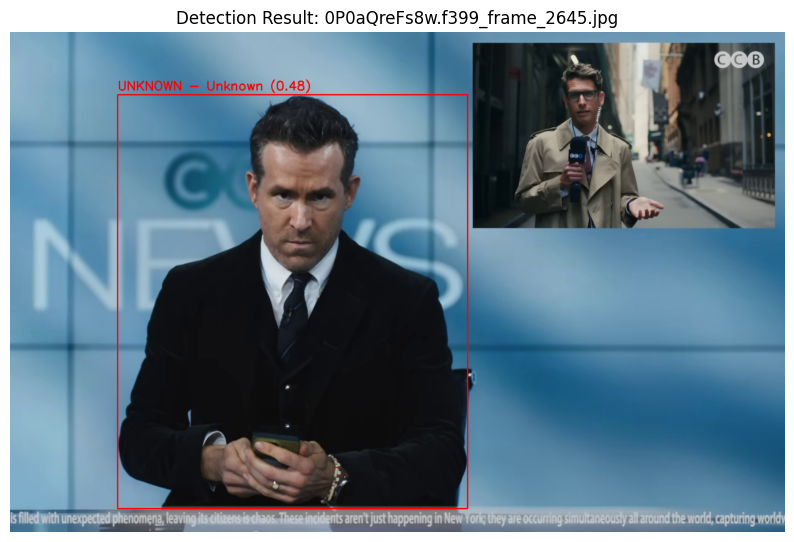

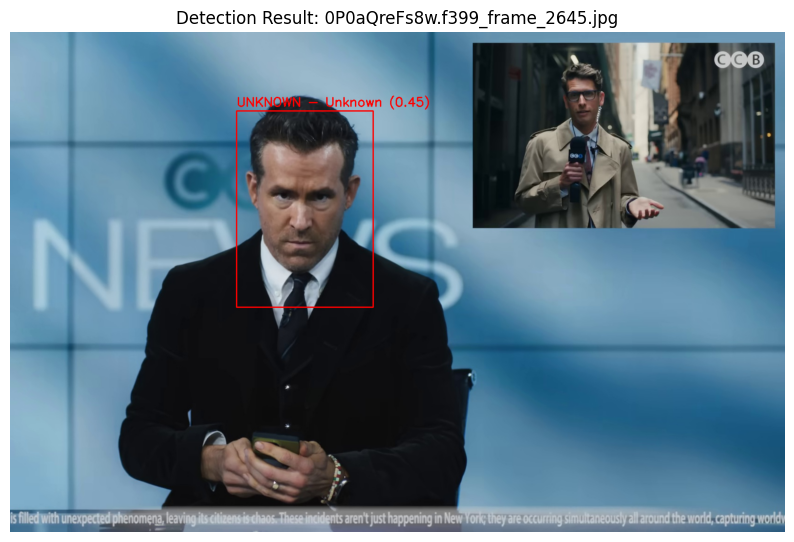


0: 384x640 3 persons, 1 tie, 1 chair, 2 remotes, 209.0ms
Speed: 2.0ms preprocess, 209.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


In [ ]:
# ✅ 8. 테스트 실행
for img_path in test_image_paths:
    detect_and_classify(img_path, method="yolo")
    detect_and_classify(img_path, method="arcface")
